In [3]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns

In [4]:
df = pd.read_csv("./../../../resulting data/referer_refered.csv", sep="\t", index_col=0)

In [5]:
df

,id,referer,GEN,EXO,LEV,NUM,DEU,JOS,JDG,RUT,...,HEB,JAM,1PE,2PE,1JO,2JO,3JO,JUD,REV,sum
0,#per1,bendito,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,#per1002,Zeeb,0,0,0,0,0,0,5,0,...,0,0,0,0,0,0,0,0,0,6
2,#per26,príncipe,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,#per1070,Joiarib,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,7
4,#pla2,tienda,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19018,#per1807,hijos de Asaf,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
19019,#org103,dioses santos,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
19020,#org19,pesadumbre,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
19021,#per304,hijo de Siftán,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [6]:
entities_df = pd.read_excel("./../../../entities.xls")

In [7]:
entities_df

,order,id,NormalizedName-sp,aclaration,variants,comments,book,cert,wikidata id,cert_wikidata,...,PHM,HEB,JAM,1PE,2PE,1JO,2JO,3JO,JUD,REV
0,2.0,#per0,persona no definida,NaN,NaN,NaN,NT,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3.0,#per1,Jesús,NaN,NaN,NaN,NT,NaN,Q302,NaN,...,13.0,75.0,5.0,34.0,24.0,48.0,7.0,0.0,8.0,102.0
2,4.0,#per2,Abraham,NaN,Abram,NaN,AT,NaN,Q9181,NaN,...,0.0,13.0,4.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5.0,#per3,Isaac,NaN,NaN,NaN,AT,NaN,Q671872,NaN,...,0.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6.0,#per4,Jacob,NaN,Israel,NaN,AT,NaN,Q289957,NaN,...,0.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3984,3985.0,#wor17,libro de Isaías,NaN,NaN,NaN,NaN,NaN,0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3985,3986.0,#wor18,libros de Lamentos,NaN,NaN,NaN,NaN,NaN,0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3986,3987.0,#ani0,animales,NaN,NaN,NaN,NaN,NaN,0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3987,3988.0,#thin0,cosa,NaN,NaN,NaN,NaN,NaN,0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
def make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per14", outdir = "./../../../visualizations/names_entities/", format_ = "png", number = 20):

    name_entity = entities_df.loc[entities_df["id"] == entity_id]["NormalizedName-sp"].values[0]
    print(name_entity)

    names_entity_df = df.loc[df["id"] == entity_id].sort_values(by="sum", ascending=False)
    names_entity_df.index = names_entity_df["referer"]
    names_entity_df = names_entity_df.iloc[:,2:-1].T



    fig, ax = plt.subplots()
    names_entity_df.iloc[ : , 0 : number].plot.bar(stacked=True, figsize=(15,5), ax = ax)
    ax.set_ylabel("frecuencia")
    ax.set_xlabel('libros')
    ax.set_title("Frecuencia total de las maneras de referirse a " + name_entity + " por libro ("+ str(number) + " maneras más frecuente)")
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.tight_layout()
    ax.get_figure().savefig(outdir + entity_id + "_total_frequency_bible." + format_ , dpi=300, format = format_)


    #names_entity_df.iloc[:,0:20].plot.bar(stacked=True, figsize=(10,5))



    names_entity_rel_df = names_entity_df.div(names_entity_df.sum(axis='columns'), axis="index")
    names_entity_rel_df["otros"] = names_entity_rel_df.iloc[:, number : ].sum(axis=1)


    names_entity_rel_df = names_entity_rel_df * 100


    fig, ax = plt.subplots()
    names_entity_rel_df[names_entity_rel_df.columns.tolist()[0 : number - 1] + names_entity_rel_df.columns.tolist()[-1:]].plot.bar(stacked=True, figsize=(15,5), cmap="tab20", ax = ax)
    ax.set_ylabel("porcentaje")
    ax.set_xlabel('libros')
    ax.set_title("Porcentaje de las maneras de referirse a " + name_entity + " por libro ("+ str(number) + " maneras más frecuente)")
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.tight_layout()
    ax.get_figure().savefig(outdir + entity_id + "_percentage_bar_frequency_bible." + format_ , dpi=300, format = format_)




    fig, ax = plt.subplots()
    names_entity_rel_df[names_entity_rel_df.columns.tolist()[0 : number - 1] + names_entity_rel_df.columns.tolist()[-1:]].plot.area(stacked=True, figsize=(15,5), cmap="tab20", ax = ax)
    ax.set_ylabel("porcentaje")
    ax.set_xlabel('libros')
    ax.set_title("Porcentaje de las maneras de referirse a " + name_entity + " por libro  ("+ str(number) + " maneras más frecuente)")
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.tight_layout()
    ax.get_figure().savefig(outdir + entity_id + "_percentage_area_frequency_bible." + format_ , dpi=300, format = format_)


    return names_entity_df, names_entity_rel_df 










Dios


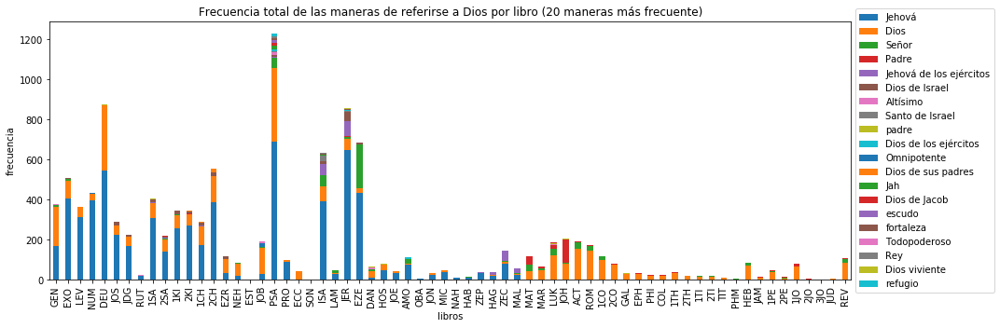

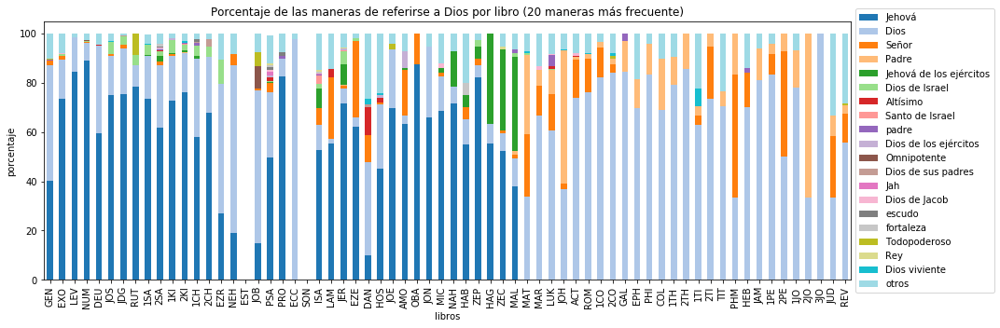

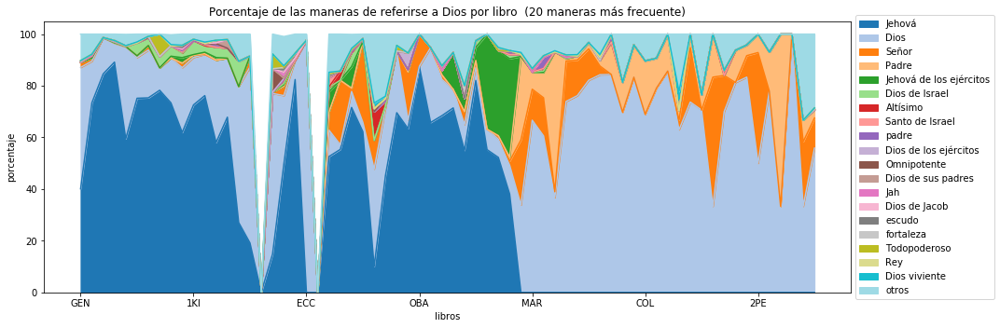

In [11]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per14", )

hebreos


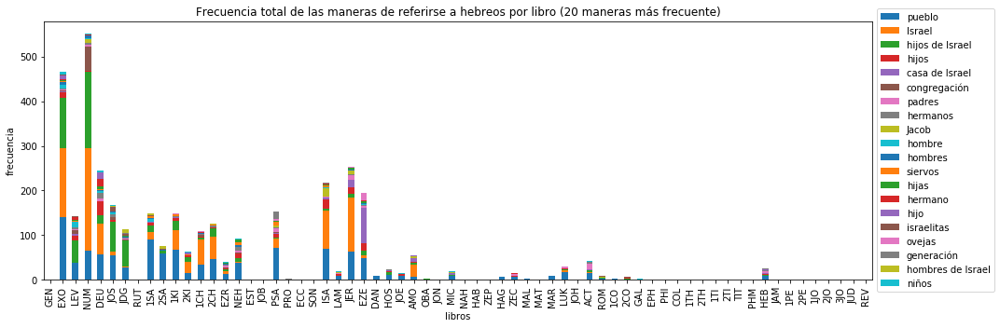

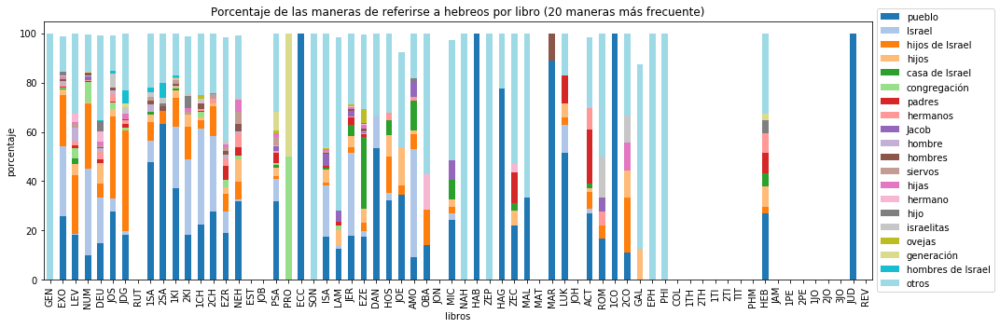

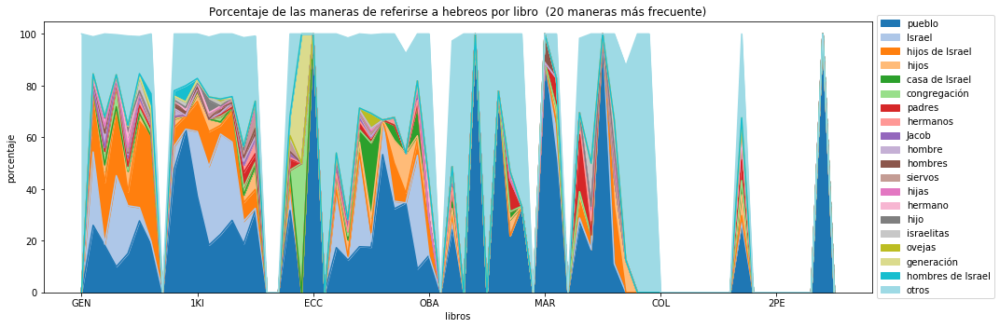

In [12]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#org70", )

Jesús


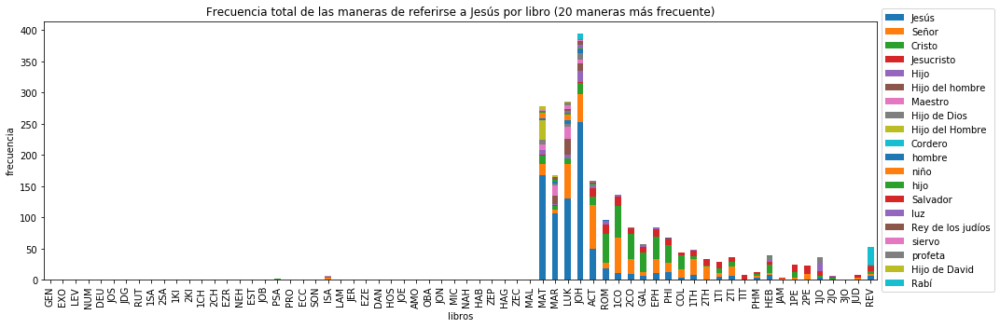

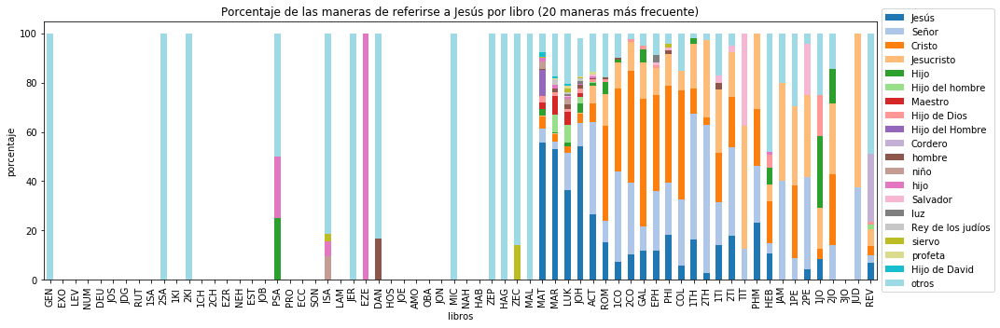

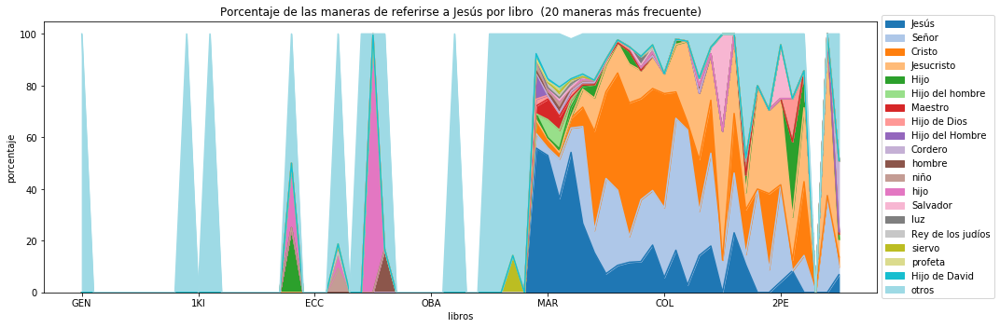

In [13]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per1", )

hebreos


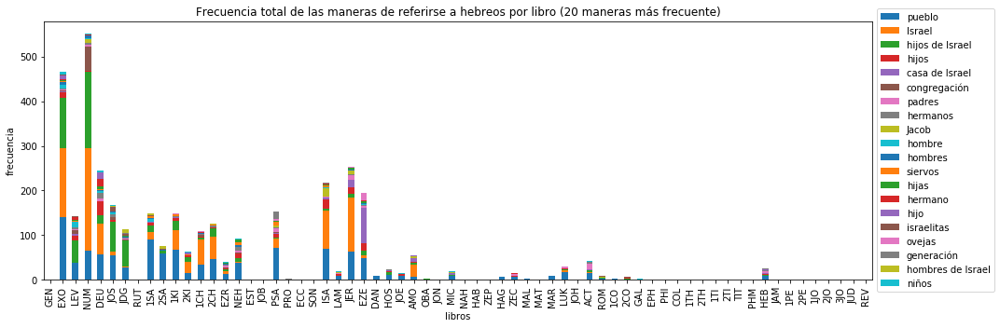

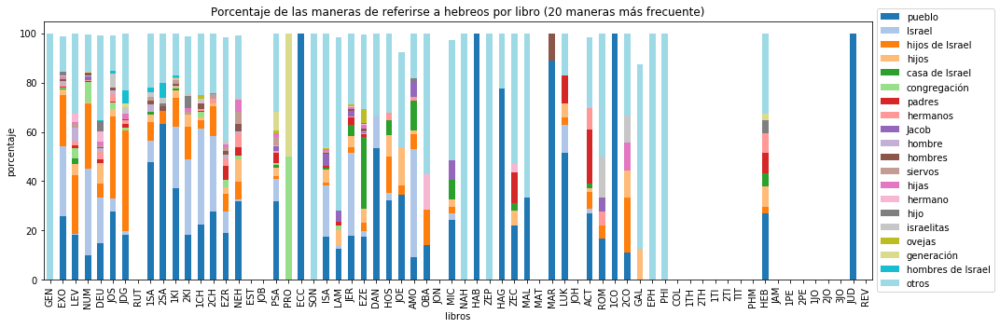

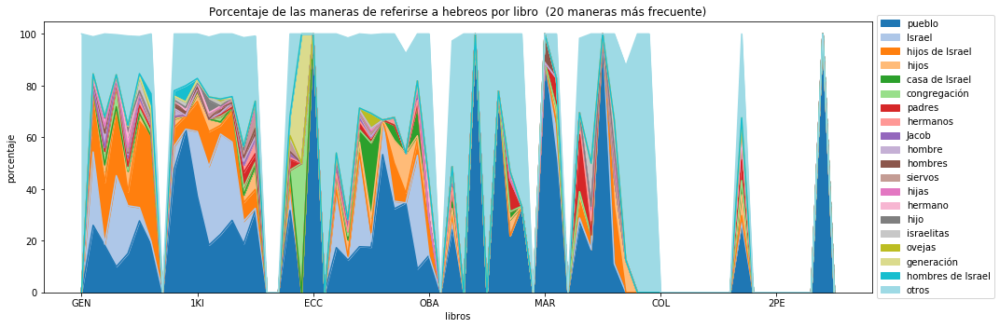

In [14]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#org70", )

gente


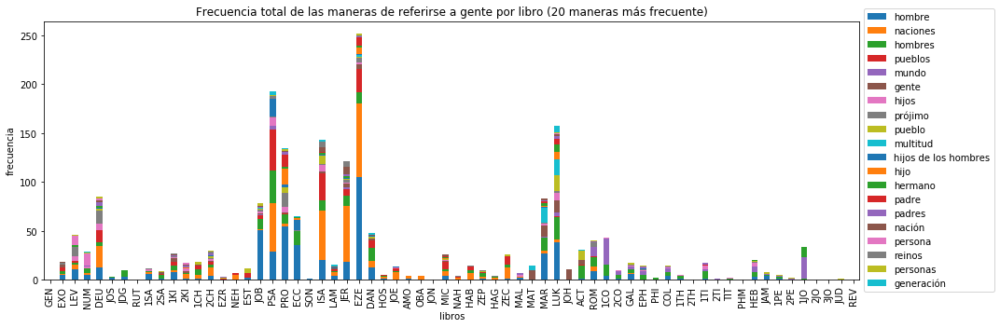

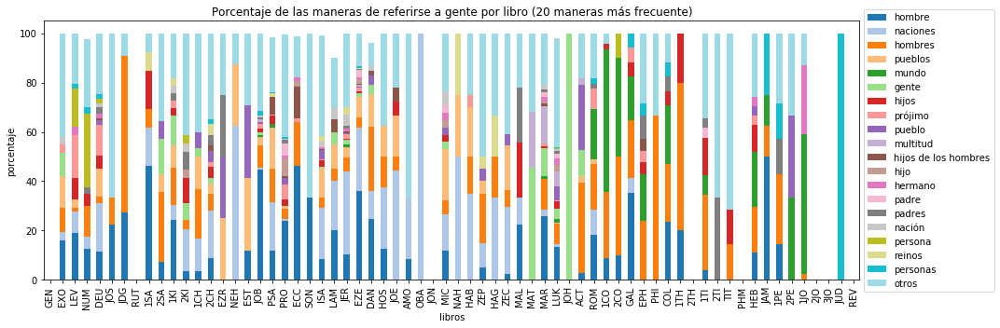

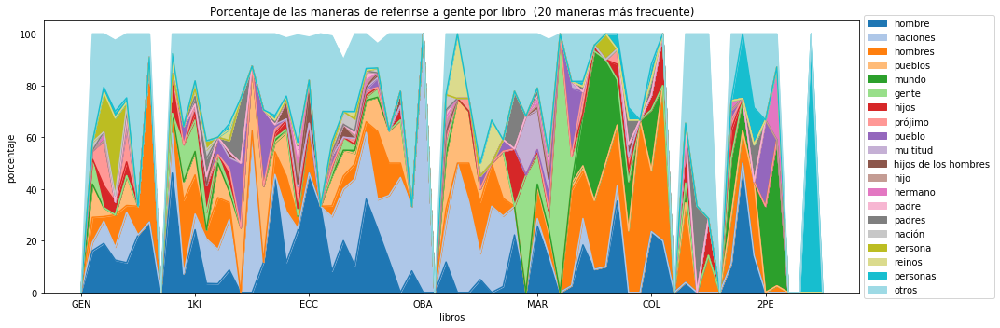

In [15]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#org0", )

Jacob


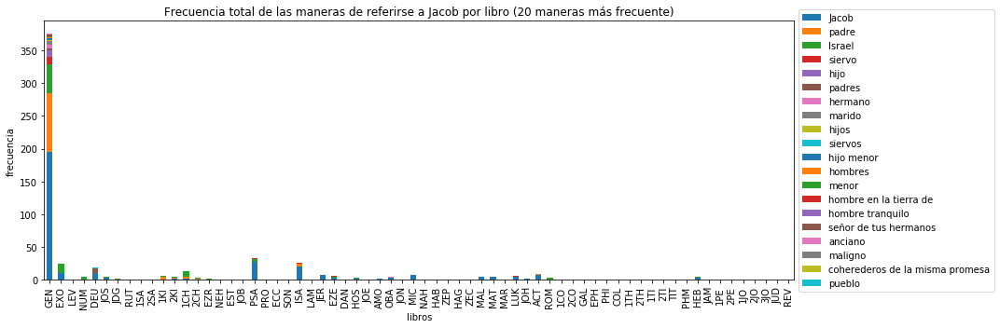

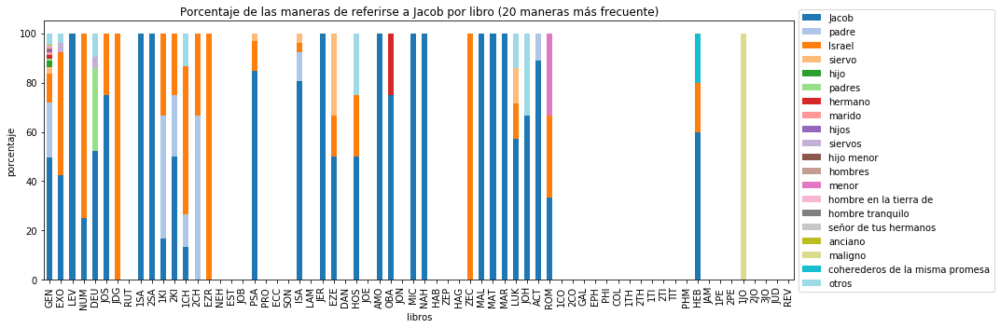

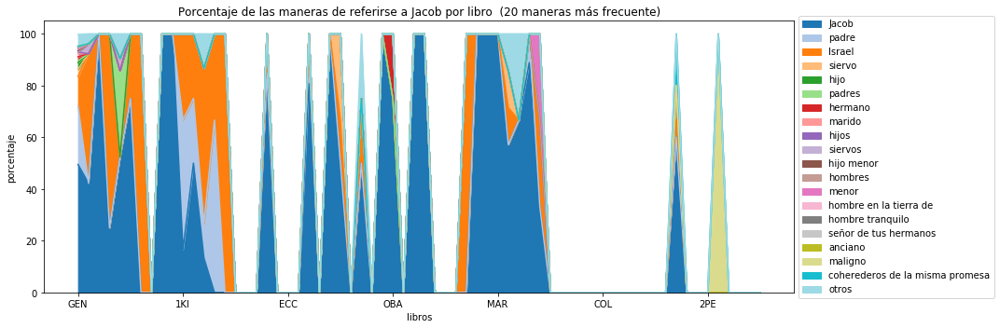

In [16]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per4", )

diablo


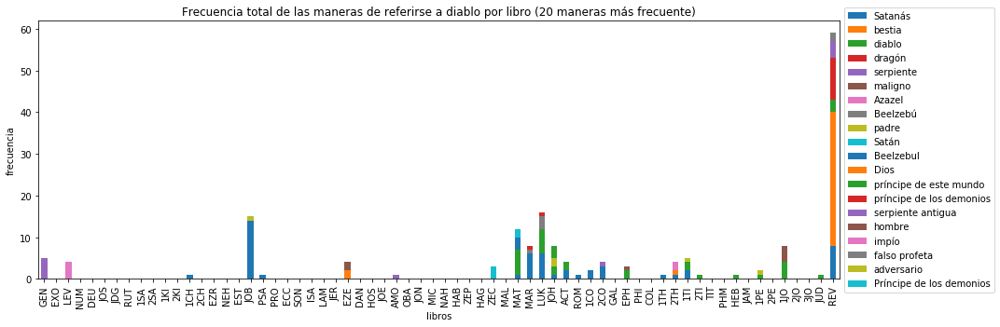

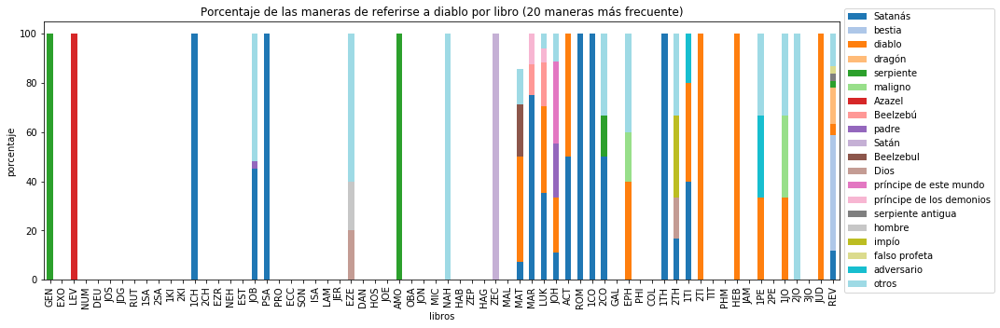

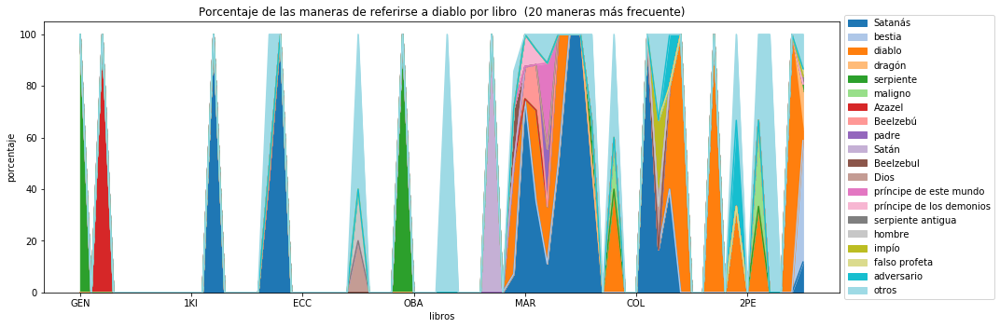

In [17]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per20", )

Espíritu Santo


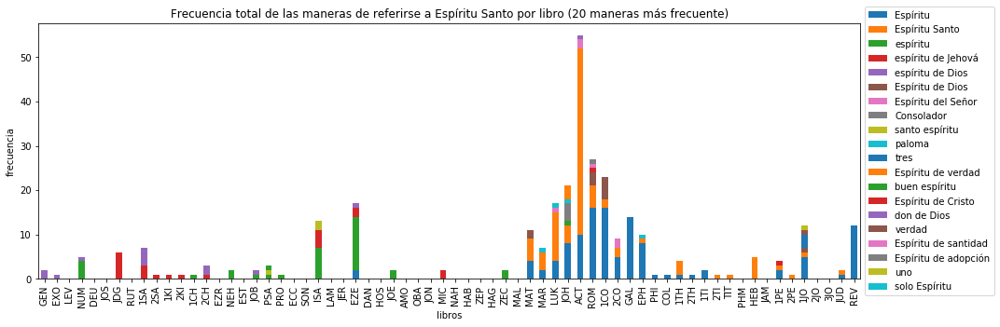

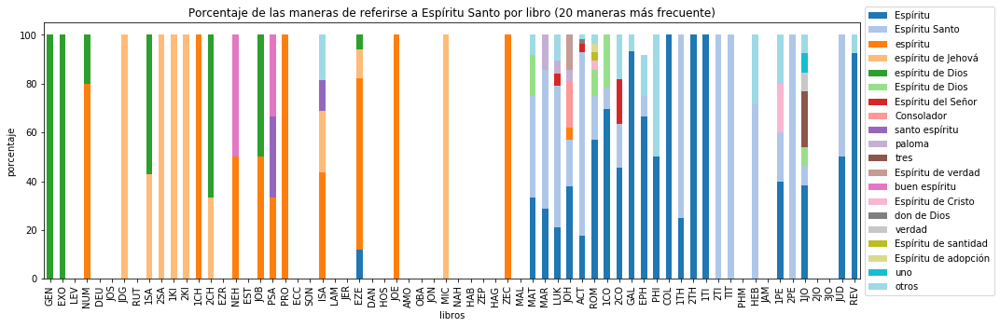

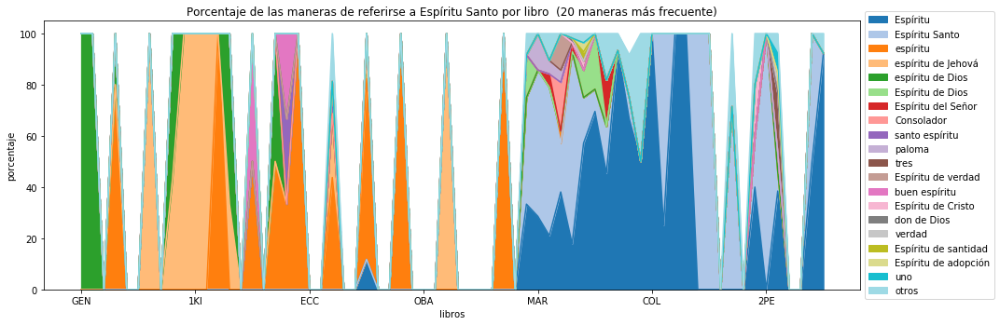

In [18]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per17", )

Moisés


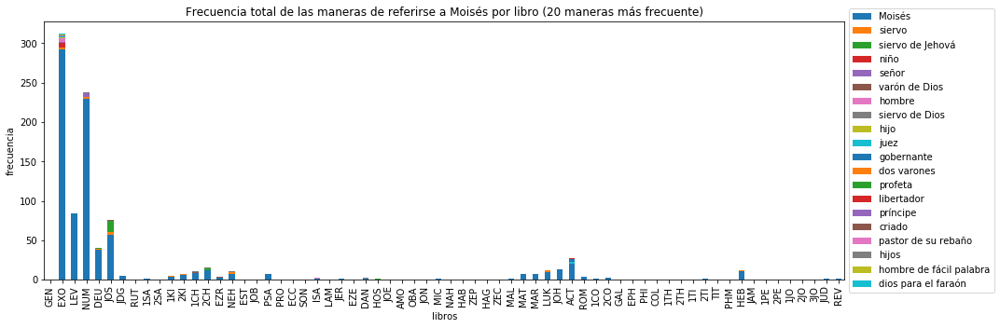

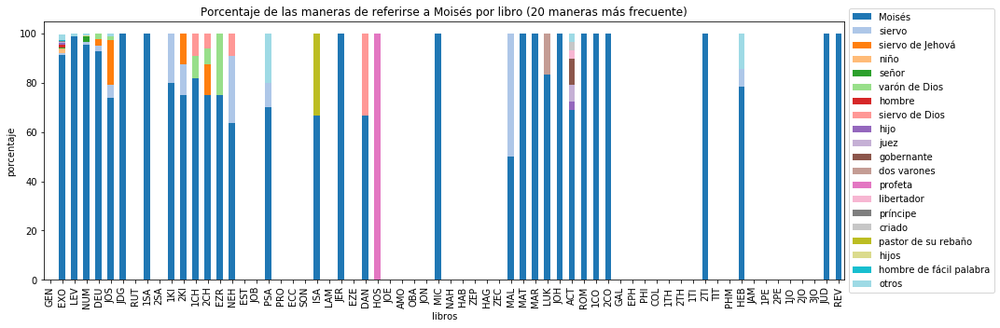

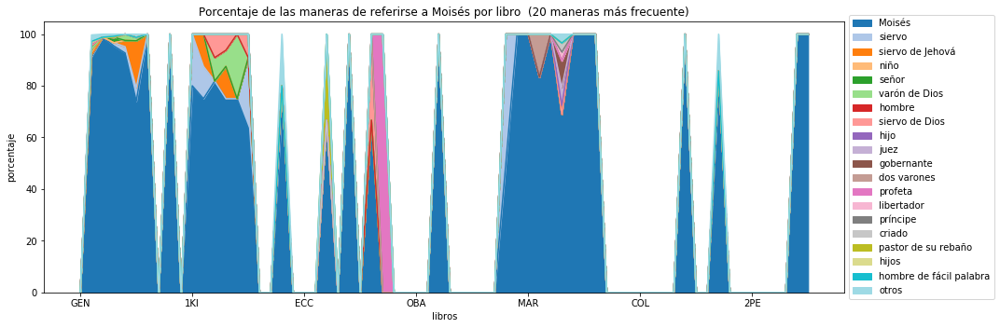

In [19]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#per26", )

judíos


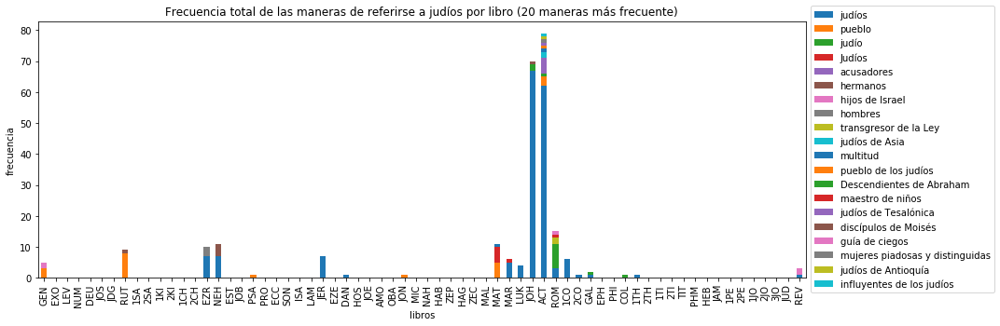

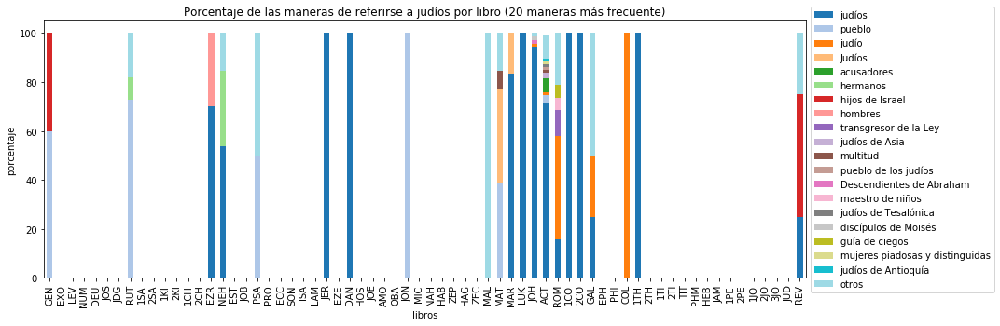

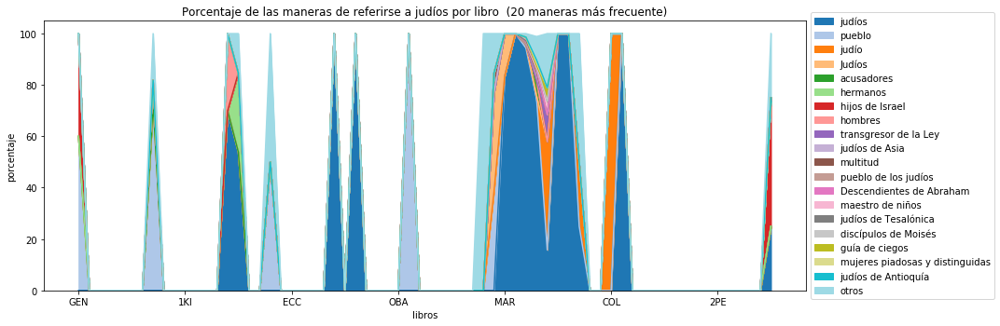

In [20]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#org13", )

pobres


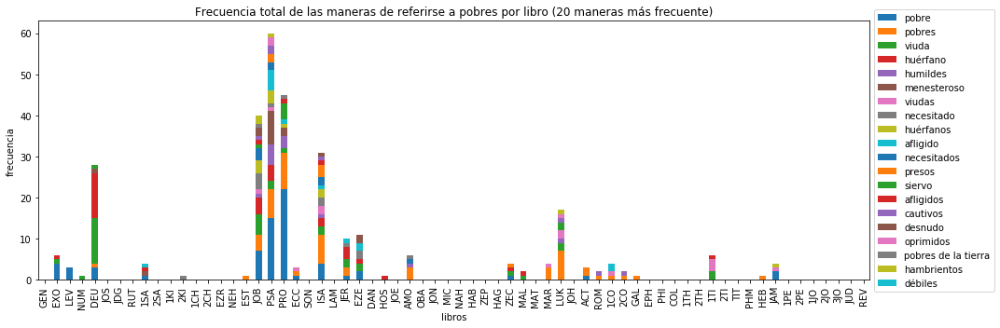

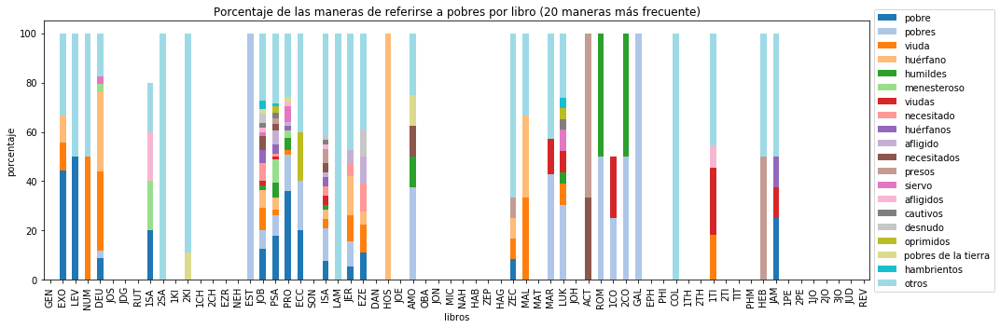

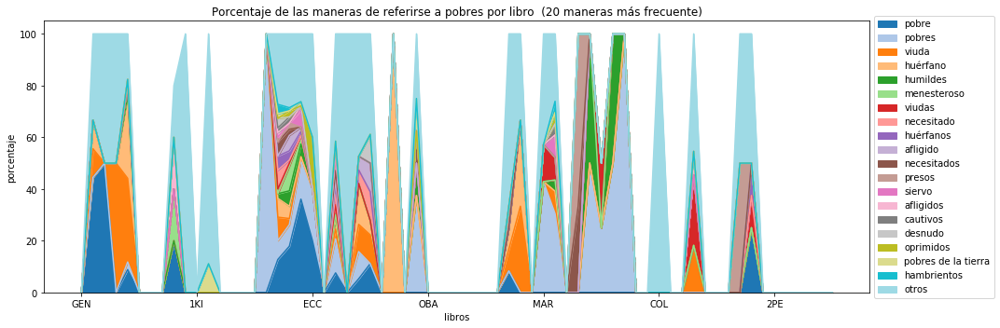

In [21]:
make_names_entity_df, names_entity_rel_df = make_visualizacion_of_entity_in_books(df, entities_df, entity_id = "#org102", )